<a href="https://colab.research.google.com/github/fransB26/MSIB-ORBIT/blob/main/Decision%20Tree%20Diabetes%20dan%20Churn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation


**Memanggil Dataset**

Sebelum memanggil dataset, dataset bisa di download pada link [ini](https://drive.google.com/file/d/1zHjUJb_32DG_-xeCWoa8XQEIl4FWaw6Z/view?usp=sharing
).

Setelah dataset berhasil di download, upload file dataset pada Google Colab agar dapat digunakan. 


In [3]:
# load dataset
db = pd.read_csv("/content/diabetes_dataset.csv")

db

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [4]:
db.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [5]:
#split dataset in features and target variable

x = db.iloc[:, :-1] # Features
y = db.iloc[:, -1] # Target variable

In [17]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [16]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 42)


In [9]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train) #Train

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [19]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7402597402597403


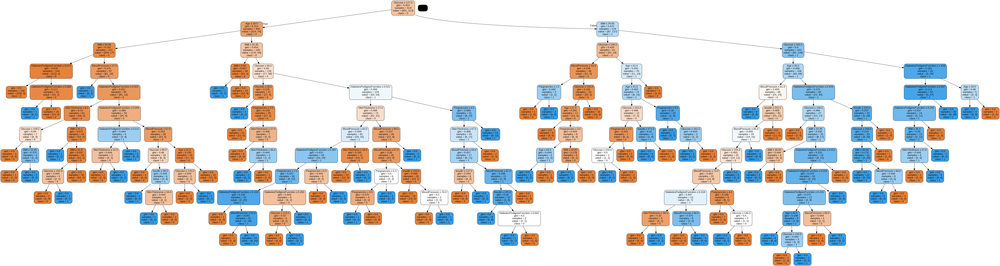

In [20]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

feature_cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())

Perhitungan skor feature apa yang paling penting

Feature: Pregnancies Score:  0.05951829809333469 %
Feature: Glucose Score:  0.3318217063193609 %
Feature: BloodPressure Score:  0.14686775171048005 %
Feature: SkinThickness Score:  0.0683903893723983 %
Feature: Insulin Score:  0.04691313486584899 %
Feature: BMI Score:  0.1466830464107405 %
Feature: DiabetesPedigreeFunction Score:  0.09749983063445226 %
Feature: Age Score:  0.10230584259338422 %


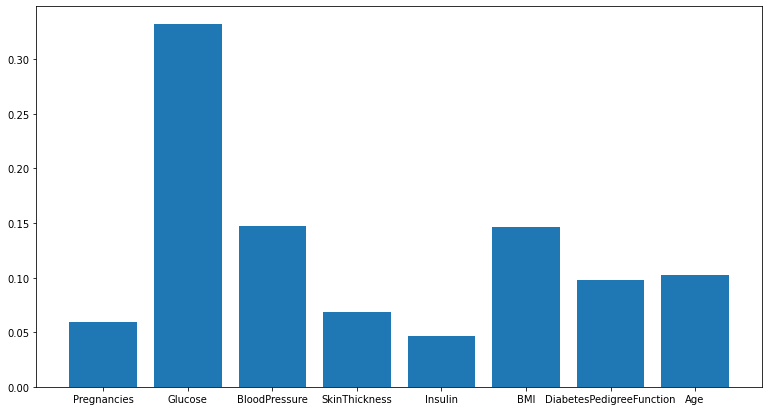

In [21]:
import matplotlib.pyplot as plt

importance = clf.feature_importances_
for i,v in enumerate(importance):
	print('Feature:', feature_cols[i],'Score: ', v, '%')
# plot feature importance
plt.figure(figsize=(13,7))
plt.bar([x for x in feature_cols], importance)
plt.show()



---



## **Tugas**

Lakukan Klasifikasi Customer Churn dengan Decision Tree:
1. buat model dan gambar pohonnya
2. Cari feature apa yang paling penting di kasus tersebut.
3. Hitung akurasinya, bandingkan dengan hasil di KNN, mana kah model yang lebih baik untuk kasus Customer churn?

In [29]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

data = pd.read_csv('/content/churnprediction_ch9.csv')
data

,customer_id,product,reload_1,reload_2,video,music,games,chat_1,chat_2,socmed_1,socmed_2,internet,days_active,tenure,churn
0,285fae8412c4720a0c79d95f98434422,Kartu A,27734.30,24381.32,22000.0,33009.9,25669.97,1716.0,2145.0,0.0,792.0,11000.0,15,776,0
1,f45bce87ca6bf100f222fcc0db06b624,Kartu A,26433.00,26515.50,0.0,0.0,0.00,0.0,15444.0,0.0,0.0,74151.0,13,352,0
2,09b54557b1e2a10d998e3473a9ccd2a0,Kartu A,93212.17,67101.83,0.0,0.0,0.00,86795.5,94649.5,330.0,1485.0,27467.0,15,1987,0
3,11f252f48be36f93dd429f2ec86cb2f5,Kartu A,183.33,1087.17,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,2,285,0
4,a8df29ae9195eea348d2f74c967b978d,Kartu A,95296.67,76246.50,0.0,0.0,11000.00,118800.0,104940.0,0.0,0.0,63855.0,15,1081,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9e8b318d96caa9c0c4a50e8e59f5026c,Kartu B,1634.33,12085.33,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,1,490,1
9996,a310627191bdbded3905ac73e77fe319,Kartu B,30000.33,45170.67,0.0,0.0,0.00,0.0,20001.0,0.0,0.0,0.0,1,3120,1
9997,b6f11059e5c1df69b8c16d5c39af23dc,Kartu B,3333.33,13338.67,0.0,0.0,872.00,0.0,0.0,0.0,0.0,0.0,1,483,1
9998,88709f1defd232243f729912be696f87,Kartu B,25000.00,33333.33,0.0,0.0,23497.33,0.0,0.0,0.0,0.0,0.0,15,786,1


In [60]:
data['product'] = data['product'].map({'Kartu A': 0, 'Kartu B': 1, 'Kartu C': 2})
data.keys()

Index(['customer_id', 'product', 'reload_1', 'reload_2', 'video', 'music',
       'games', 'chat_1', 'chat_2', 'socmed_1', 'socmed_2', 'internet',
       'days_active', 'tenure', 'churn'],
      dtype='object')

In [53]:
X = data.iloc[:, 1:-1]
Y = data['churn'].values
X

,product,reload_1,reload_2,video,music,games,chat_1,chat_2,socmed_1,socmed_2,internet,days_active,tenure
0,0,27734.30,24381.32,22000.0,33009.9,25669.97,1716.0,2145.0,0.0,792.0,11000.0,15,776
1,0,26433.00,26515.50,0.0,0.0,0.00,0.0,15444.0,0.0,0.0,74151.0,13,352
2,0,93212.17,67101.83,0.0,0.0,0.00,86795.5,94649.5,330.0,1485.0,27467.0,15,1987
3,0,183.33,1087.17,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,2,285
4,0,95296.67,76246.50,0.0,0.0,11000.00,118800.0,104940.0,0.0,0.0,63855.0,15,1081
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,1634.33,12085.33,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,1,490
9996,1,30000.33,45170.67,0.0,0.0,0.00,0.0,20001.0,0.0,0.0,0.0,1,3120
9997,1,3333.33,13338.67,0.0,0.0,872.00,0.0,0.0,0.0,0.0,0.0,1,483
9998,1,25000.00,33333.33,0.0,0.0,23497.33,0.0,0.0,0.0,0.0,0.0,15,786


In [54]:
X_train, X_test, Y_train, Y_test = train_test_split( X, Y, test_size=0.2, random_state=42)
print ('Train set:', X_train.shape,  Y_train.shape)
print ('Test set:', X_test.shape,  Y_test.shape)


Train set: (8000, 13) (8000,)
Test set: (2000, 13) (2000,)


In [64]:
# Create Decision Tree classifer object
dtc = DecisionTreeClassifier()

# Train Decision Tree Classifer
dtc = dtc.fit(X_train, Y_train) #Train

#Predict the response for test dataset
y_pred = dtc.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(Y_test, y_pred))

Accuracy: 0.935


In [62]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

feature_cols = ['product', 'reload_1', 'reload_2', 'video', 'music',
       'games', 'chat_1', 'chat_2', 'socmed_1', 'socmed_2', 'internet',
       'days_active', 'tenure']
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('churn.png')
Image(graph.create_png())

Feature: product Score:  0.028945721794750325 %
Feature: reload_1 Score:  0.0378435551984866 %
Feature: reload_2 Score:  0.35232987231822926 %
Feature: video Score:  0.008520096731888567 %
Feature: music Score:  0.004957559911242807 %
Feature: games Score:  0.0333916221093996 %
Feature: chat_1 Score:  0.01912227619046632 %
Feature: chat_2 Score:  0.005612782381524589 %
Feature: socmed_1 Score:  0.004706116400732313 %
Feature: socmed_2 Score:  0.0035678030223300562 %
Feature: internet Score:  0.049265500088851846 %
Feature: days_active Score:  0.22073804631774313 %
Feature: tenure Score:  0.2309990475343547 %


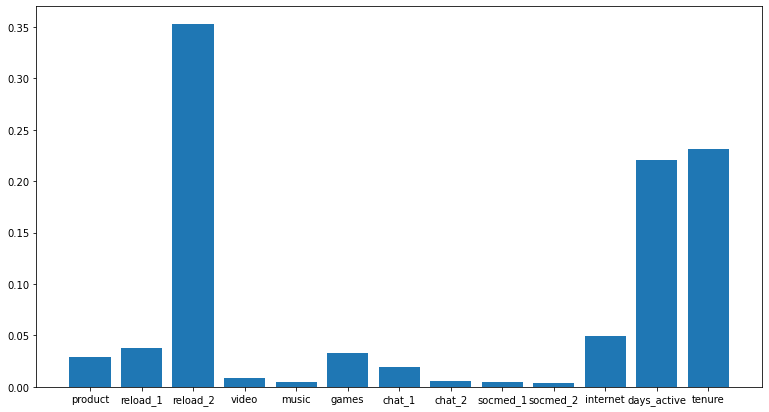

In [63]:
import matplotlib.pyplot as plt

importance = dtc.feature_importances_
for i,v in enumerate(importance):
	print('Feature:', feature_cols[i],'Score: ', v, '%')
# plot feature importance
plt.figure(figsize=(13,7))
plt.bar([X for X in feature_cols], importance)
plt.show()